## File: VUMC_data_info.ipynb
---
**Description:** <br>
This files has a compilation of information that pertains to the data used in cody's paper and analysis

In [1]:
import pandas as pd
import numpy 
import scanpy as sc
from IPython.display import Image
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

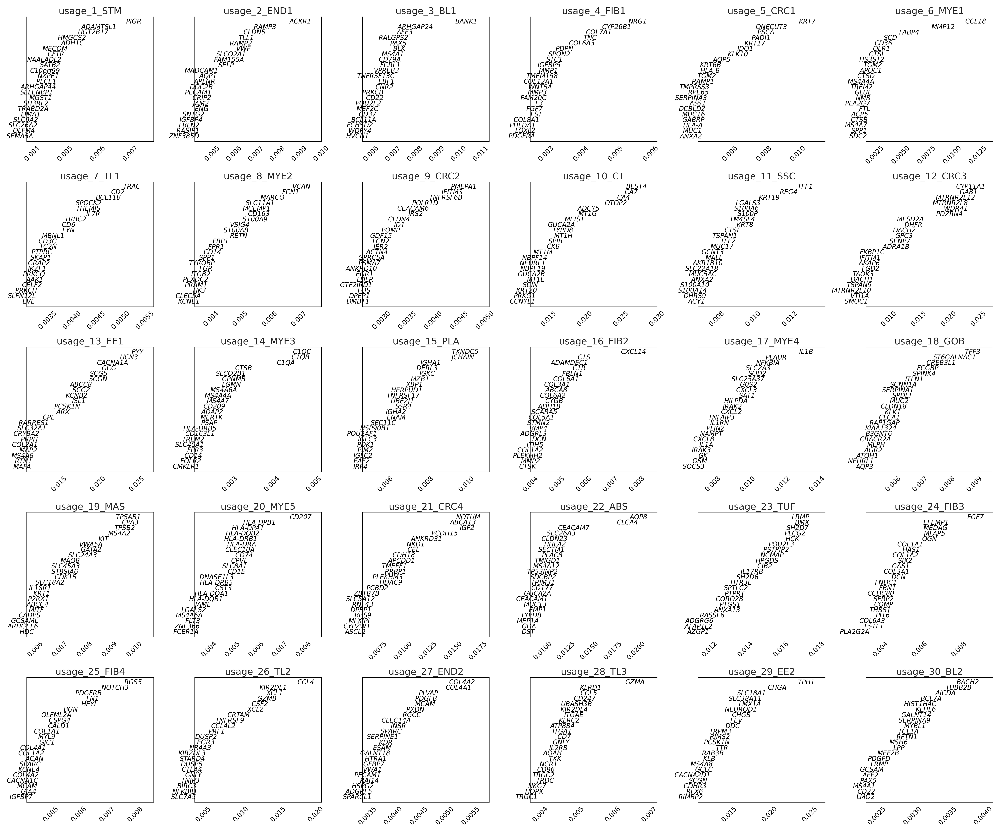

In [2]:
Image(filename='/mnt/md0/cody/scRNA_NMF/VUMC_NMF/VUMC_NMF_k30_dt0_1_spectra.png') 

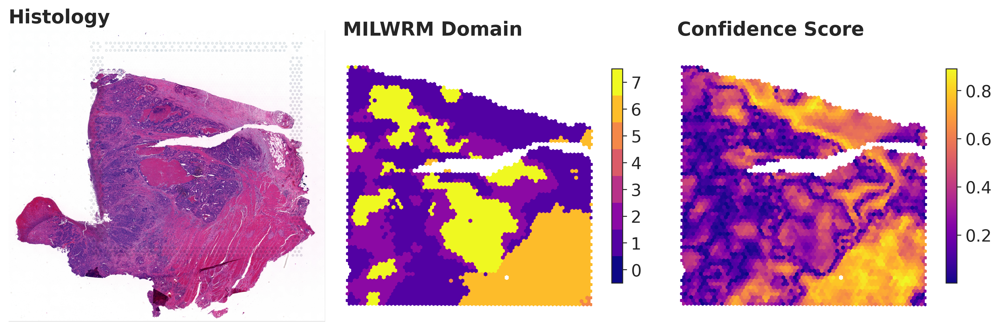

In [3]:
Image(filename='/home/cody/git/spatial_CRC_atlas/step1/ST_out/MILWRM_VUMC_refNMF/6723_1_WD86056_refNMF_MILWRM_r2_k8.png') 

## **Cody Data** ##
1. Has 22,638 cells with 16,464 genes <br>
   a. Likely down sampled from original data usning a proportional approach
2. Usages and Cell Type used for defining the usages as a specific cell type 

In [4]:
VUMC_adata = sc.read_h5ad("/mnt/md0/cody/scRNA_anndatas/VUMC_COMBINED.h5ad")
print(VUMC_adata)

AnnData object with n_obs × n_vars = 22638 × 16464
    obs: 'HTAN Specimen ID', 'Cell_Type', 'Tumor_Type', 'Compartment', 'Patient'
    var: 'n_cells', 'gene_id', 'chromosome', 'start', 'end'
    obsm: 'X_pca', 'X_umap'


/home/james/anaconda3/envs/rot_env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


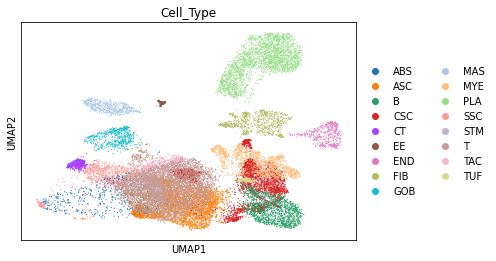

In [5]:
sc.pl.umap(
    VUMC_adata,
    color = ["Cell_Type"],
    #save = '_VUMC_cell_type.png'
    )

In [7]:
VUMC_adata.obs['Cell_Type'].value_counts()

T      4410
ASC    3812
CSC    3706
PLA    2238
SSC    1232
B      1228
MYE    1210
FIB     713
MAS     507
ABS     500
TAC     500
STM     500
GOB     500
CT      500
TUF     442
END     394
EE      246
Name: Cell_Type, dtype: int64

In [8]:
VUMC_adata.obs['Patient'].value_counts()

               15724
HTA11_07663     1150
HTA11_08622     1003
HTA11_07862      981
PAT73899         861
HTA11_01938      664
PAT71662         641
PAT71397         580
PAT74143         352
HTA11_06134      290
PAT73458         272
HTA11_10711      120
Name: Patient, dtype: int64

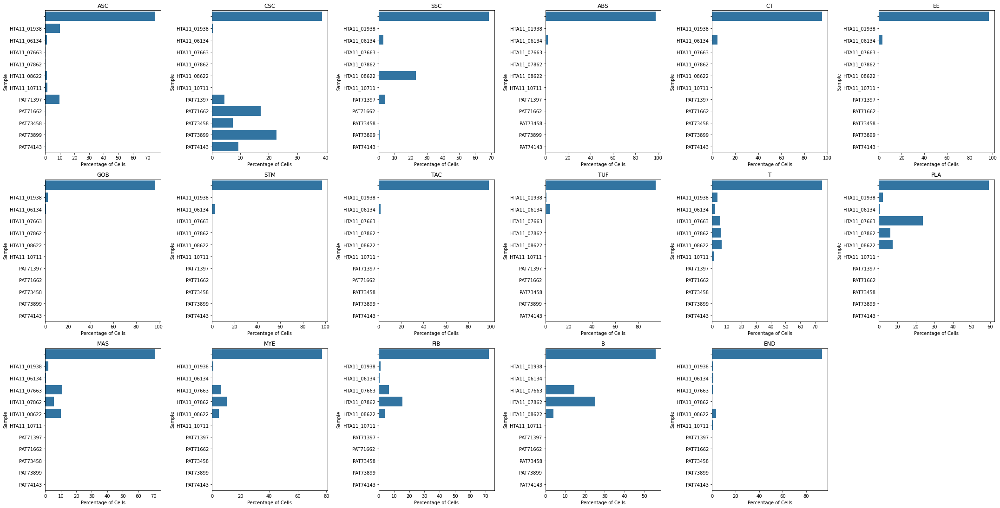

In [13]:
df = VUMC_adata.obs[['Patient', 'Cell_Type']].copy()

# Get unique cell types
unique_cell_types = df['Cell_Type'].unique()

# Calculate percentages beforehand for efficiency
cell_type_percentages = {}
for cell_type in unique_cell_types:
    subset_df = df[df['Cell_Type'] == cell_type]
    sample_counts = subset_df.groupby('Patient').size().reset_index(name='Count')
    total_cells = len(subset_df)
    sample_counts['Percentage'] = (sample_counts['Count'] / total_cells) * 100
    cell_type_percentages[cell_type] = sample_counts


# Determine grid dimensions
n_cols = 6  # Adjust as needed for layout
n_rows = 5

# Create the figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 5 * n_rows), facecolor='white')  # Adjust figsize

# Iterate and plot on the grid
for i, cell_type in enumerate(unique_cell_types):
    row = i // n_cols
    col = i % n_cols
    ax = axes[row, col] if n_rows > 1 else axes[col]  #Handle single-row case
    sns.barplot(x='Percentage', y='Patient', data=cell_type_percentages[cell_type], ax=ax)
    ax.set_title(f'{cell_type}')
    ax.set_xlabel('Percentage of Cells')
    ax.set_ylabel('Sample')

# Remove any unused subplots if there are fewer plots than grid cells.
for i in range(len(unique_cell_types), n_rows * n_cols):
    row = i // n_cols
    col = i % n_cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
#plt.savefig("my.png",facecolor=fig.get_facecolor())
plt.show()

## I do not know why the top bar on each of the plots above accounts for the entire thing for some reason

In [14]:
sc.pl.umap(VUMC_adata,
           color = 'Patient',
           #save = '_patient.png'
          )

/home/james/anaconda3/envs/rot_env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
